In [11]:
import pandas as pd
file_path = 'C:/Users/dmarc/Desktop/EWELD_Project/EWELD/combined_ec_df.pkl'
combined_ec_df = pd.read_pickle(file_path)


MemoryError: 

In [13]:
print(type(combined_ec_df))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
# List of users filter criteria - first plots
filter_set = ['U10','U99','U165','U256','U258','U263','U267','U271','U276','U280','U283','U317','U353','U357','U364','U380','U381','U386']

filtered_ec_df = combined_ec_df[combined_ec_df['User'].isin(filter_set)].copy()
print(type(filtered_ec_df))
print(filtered_ec_df.head(3))

<class 'pandas.core.frame.DataFrame'>
                        Division         Division Name Div_Sec Section  \
655673  A02 Forestry and logging  Forestry and logging     A02       A   
655674  A02 Forestry and logging  Forestry and logging     A02       A   
655675  A02 Forestry and logging  Forestry and logging     A02       A   

       Division code User                 Time  Energy_cons [kWh]  
655673            02  U10  2017-08-25 11:45:00            46.3009  
655674            02  U10  2017-08-25 12:00:00            36.9415  
655675            02  U10  2017-08-25 12:15:00            20.7641  


Converting the 'Time' column to datetime and setting it as the DataFrame index is a best practice when working with time series data in pandas

In [ ]:
# Convert 'Time' column to datetime and set as index
filtered_ec_df['Time'] = pd.to_datetime(filtered_ec_df['Time'])
# Set 'Time' as the index
filtered_ec_df.set_index('Time', inplace=True)
print(filtered_ec_df.head(3))

                                     Division         Division Name Div_Sec  \
Time                                                                          
2017-08-25 11:45:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:00:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:15:00  A02 Forestry and logging  Forestry and logging     A02   

                    Section Division code User  Energy_cons [kWh]  
Time                                                               
2017-08-25 11:45:00       A            02  U10            46.3009  
2017-08-25 12:00:00       A            02  U10            36.9415  
2017-08-25 12:15:00       A            02  U10            20.7641  


In [26]:
print("Data types:\n", filtered_ec_df.dtypes)

Data types:
 Division              object
Division Name         object
Div_Sec               object
Section               object
Division code         object
User                  object
Energy_cons [kWh]    float64
dtype: object


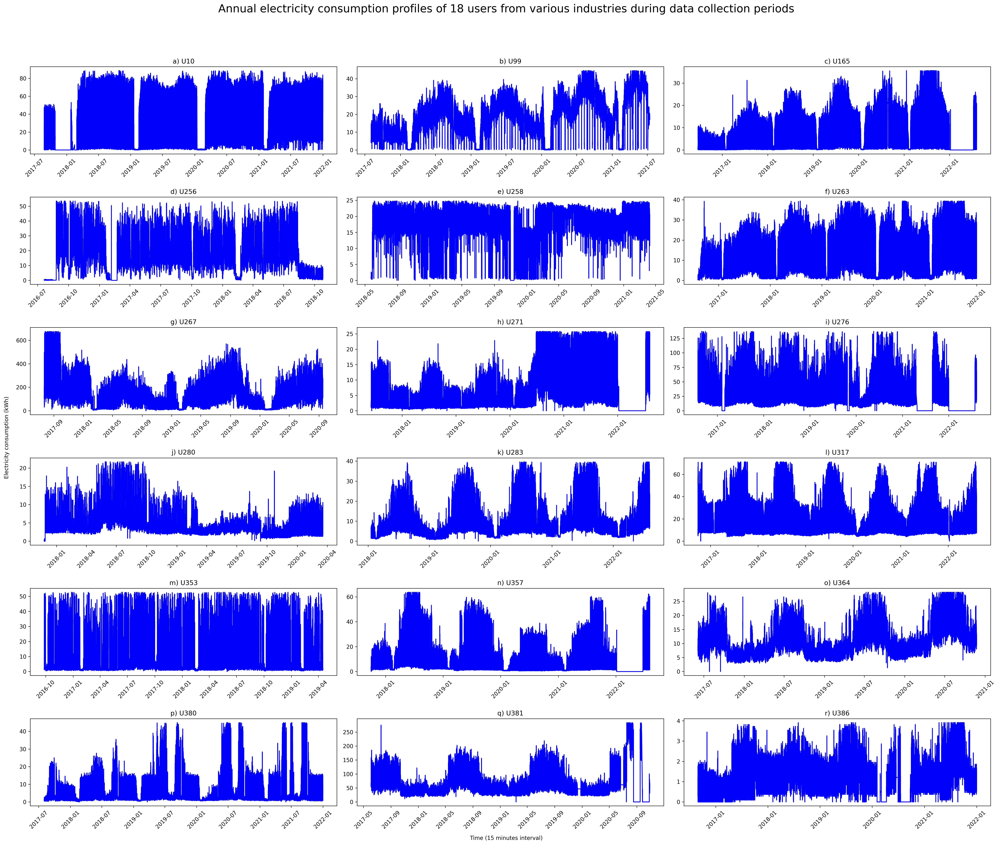

In [21]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
num_set = ['a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r']
fig = plt.figure(figsize=(25, 20), dpi=300)

for i in range(len(filter_set)):
    # Filter data for each user
    d = filtered_ec_df[filtered_ec_df['User'] == filter_set[i]]['Energy_cons [kWh]']
    plt.subplot(6, 3, i+1)
    plt.plot(d, 'b')
    plt.title(num_set[i] + ') ' + filter_set[i])
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.xticks(rotation=45)

fig.text(0.5, -0.01, 'Time (15 minutes interval)', ha='center')
fig.text(-0.01, 0.5, 'Electricity consumption (kWh)', va='center', rotation='vertical')

# Add main title
fig.suptitle("Annual electricity consumption profiles of 18 users from various industries during data collection periods",
              fontsize=20,
              y=1.05)


fig.tight_layout(pad=0.4, w_pad=1.0, h_pad=2.0)
fig.savefig('annual_18plot.svg', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
##for second plots filter_set2
filter_set2 = ['U10','U99','U165','U263','U283','U317','U364','U380','U381']
filtered_ec_df2 = combined_ec_df[combined_ec_df['User'].isin(filter_set2)].copy()


In [39]:
# Print the unique users in the filtered DataFrame to verify the result
unique_users = filtered_ec_df2['User'].unique()
print("Unique users in filtered_ec_df2:", unique_users)

Unique users in filtered_ec_df2: ['U10' 'U99' 'U165' 'U263' 'U283' 'U317' 'U364' 'U380' 'U381']


In [40]:
print("Data types:\n", filtered_ec_df2.dtypes)

Data types:
 Division                     object
Division Name                object
Div_Sec                      object
Section                      object
Division code                object
User                         object
Time                 datetime64[ns]
Energy_cons [kWh]           float64
dtype: object


In [45]:
print(filtered_ec_df.head(3))

                                     Division         Division Name Div_Sec  \
Time                                                                          
2017-08-25 11:45:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:00:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:15:00  A02 Forestry and logging  Forestry and logging     A02   

                    Section Division code User  Energy_cons [kWh]  
Time                                                               
2017-08-25 11:45:00       A            02  U10            46.3009  
2017-08-25 12:00:00       A            02  U10            36.9415  
2017-08-25 12:15:00       A            02  U10            20.7641  


In [41]:
'2018-09-01 00:00:00' in filtered_ec_df2.Time


False

In [52]:
# Show all rows where User == 'U10'
user_u10_df = filtered_ec_df2[filtered_ec_df2['User'] == 'U10']
print(user_u10_df)
print('----\n')
print(user_u10_df.Time.min())
print(user_u10_df.Time.max())

                        Division         Division Name Div_Sec Section  \
655673  A02 Forestry and logging  Forestry and logging     A02       A   
655674  A02 Forestry and logging  Forestry and logging     A02       A   
655675  A02 Forestry and logging  Forestry and logging     A02       A   
655676  A02 Forestry and logging  Forestry and logging     A02       A   
655677  A02 Forestry and logging  Forestry and logging     A02       A   
...                          ...                   ...     ...     ...   
808261  A02 Forestry and logging  Forestry and logging     A02       A   
808262  A02 Forestry and logging  Forestry and logging     A02       A   
808263  A02 Forestry and logging  Forestry and logging     A02       A   
808264  A02 Forestry and logging  Forestry and logging     A02       A   
808265  A02 Forestry and logging  Forestry and logging     A02       A   

       Division code User                Time  Energy_cons [kWh]  
655673            02  U10 2017-08-25 11:45:0

In [ ]:
print(filtered_ec_df2.Time.min())
print(filtered_ec_df2.Time.max())

2016-06-19 00:15:00
2022-08-06 23:45:00


In [54]:
filtered_ec_df2['Time'] = pd.to_datetime(filtered_ec_df2['Time'], errors='coerce')
invalid_dates = filtered_ec_df2[filtered_ec_df2['Time'].isna()]
print(invalid_dates)

Empty DataFrame
Columns: [Division, Division Name, Div_Sec, Section, Division code, User, Time, Energy_cons [kWh]]
Index: []


In [47]:
print(filtered_ec_df2['Time'].dtype)

datetime64[ns]


In [62]:
# Convert 'Time' column to datetime and set as index
filtered_ec_df2['Time'] = pd.to_datetime(filtered_ec_df2['Time'])
# Set 'Time' as the index
filtered_ec_df2.set_index('Time', inplace=True)
print(filtered_ec_df2.head(3))

                                     Division         Division Name Div_Sec  \
Time                                                                          
2017-08-25 11:45:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:00:00  A02 Forestry and logging  Forestry and logging     A02   
2017-08-25 12:15:00  A02 Forestry and logging  Forestry and logging     A02   

                    Section Division code User  Energy_cons [kWh]  
Time                                                               
2017-08-25 11:45:00       A            02  U10            46.3009  
2017-08-25 12:00:00       A            02  U10            36.9415  
2017-08-25 12:15:00       A            02  U10            20.7641  


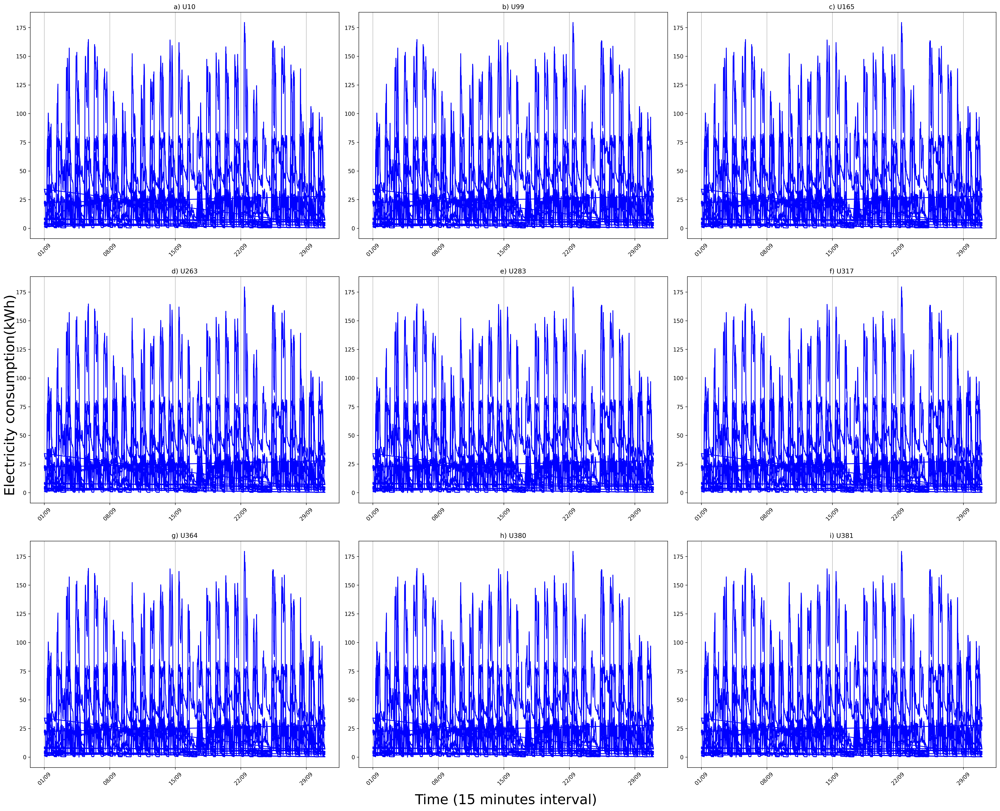

In [72]:
import os
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

os.makedirs('plot_figure', exist_ok=True)
num_set2 = ['a','b','c','d','e','f','g','h','i']
fig = plt.figure(figsize=(25, 20), dpi=300)

for i in range(9):
    user = filter_set2[i]
    mask = (
    
        (filtered_ec_df2.index >= '2018-09-01 00:00:00') &
        (filtered_ec_df2.index <= '2018-10-01 00:00:00')
    )
    d = filtered_ec_df2[mask]['Energy_cons [kWh]']
    
    plt.subplot(3, 3, i+1)
    plt.plot(d.index, d.values, 'b')
    plt.title(f"{num_set2[i]}) {user}")
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%d/%m'))
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=7))
    plt.xticks(rotation=45)
    plt.grid(which='major', axis='x')

fig.text(0.5, -0.02, 'Time (15 minutes interval)', ha='center', fontsize=25)
fig.text(-0.01, 0.5, 'Electricity consumption(kWh)', va='center', rotation='vertical', fontsize=25)
# plt.title('')
fig.tight_layout(pad=0.4, w_pad=1.0, h_pad=2.0)
fig.savefig('plot_figure/monthly_9plot.svg', dpi=300, bbox_inches='tight')
#plt.close(fig)



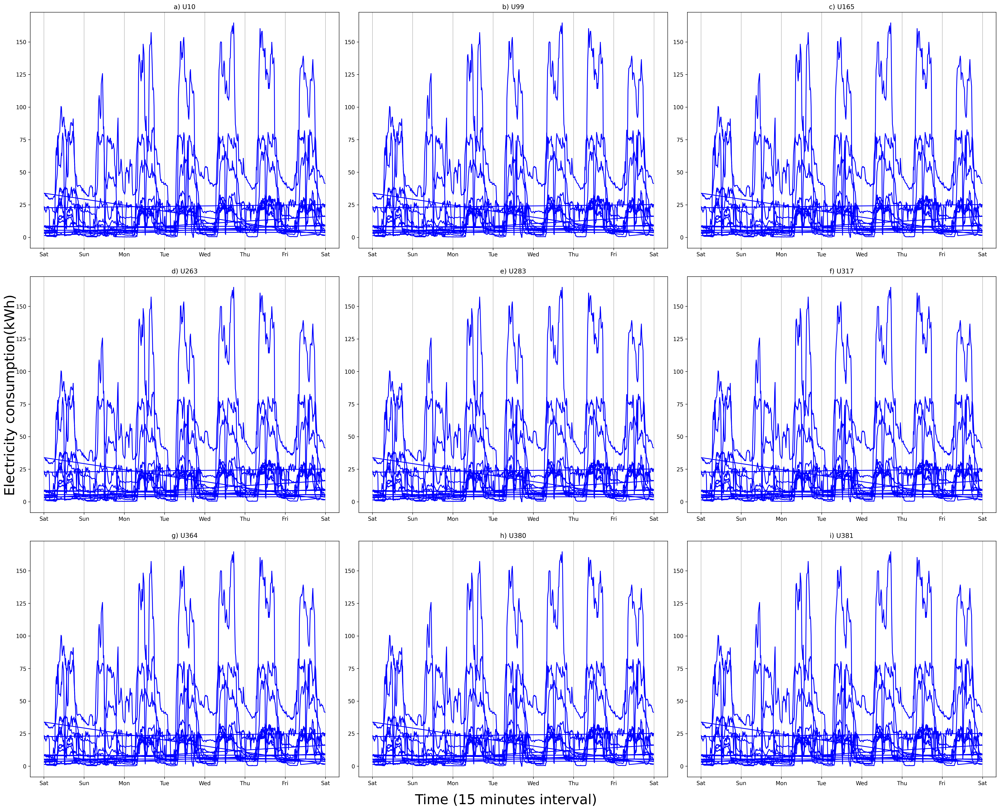

In [82]:
####weekly
fig = plt.figure(figsize=(25, 20), dpi=300)
num_set2 = ['a','b','c','d','e','f','g','h','i']
for i in range(9):
    user = filter_set2[i]
    mask = (
    
        (filtered_ec_df2.index > '2018-09-01 00:00:00') &
        (filtered_ec_df2.index <'2018-09-08 00:00:00')
    )
    d = filtered_ec_df2[mask]['Energy_cons [kWh]']
    
    plt.subplot(3,3,i+1)
    plt.plot(d,'b')
    plt.title(num_set2[i]+') '+filter_set2[i])
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%a'))
    plt.gca().xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=[0,1,2,3,4,5,6]))
    # plt.xticks(rotation =45)
    plt.grid(which = 'major',axis = 'x')
fig.text(0.5, -0.02, 'Time (15 minutes interval)', ha='center',fontsize = 25)
fig.text(-0.01, 0.5, 'Electricity consumption(kWh)', va='center', rotation='vertical',fontsize = 25)
# plt.title('')
fig.tight_layout(pad=0.4, w_pad=1.0, h_pad=2.0)
fig.savefig('plot_figure/weekly_9plot.svg', dpi=300,bbox_inches = 'tight')

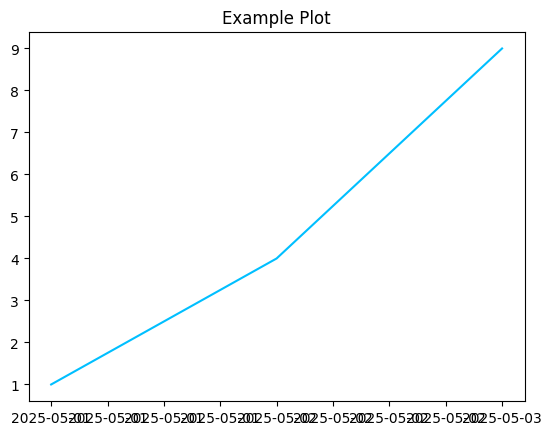

In [89]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Example data
import pandas as pd
dates = pd.date_range('2025-05-01', periods=3)
values = [1, 4, 9]

# Create the plot
fig, ax = plt.subplots()
ax.plot(dates, values, color='deepskyblue')

# Set title and format x-axis with dates
ax.set_title('Example Plot')
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

plt.show()


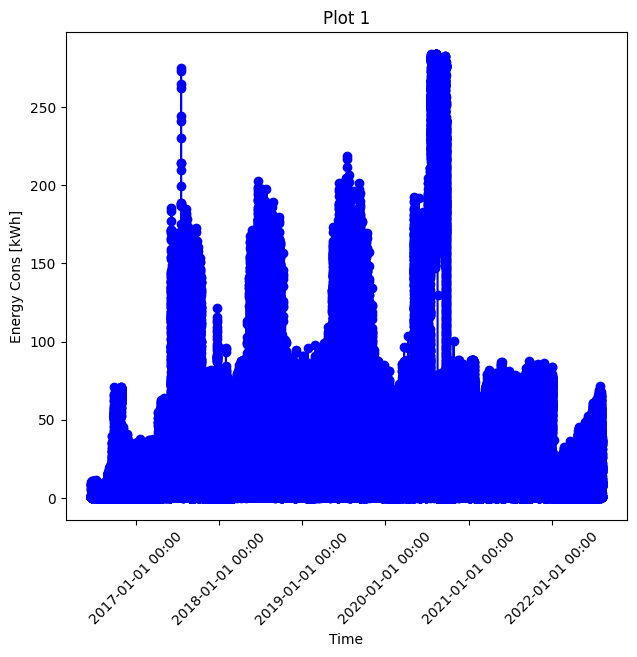

In [91]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Assuming filtered_ec_df2 is already defined as in your example

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()

# For demonstration, we'll plot the same data in the first subplot(s)
for i, ax in enumerate(axes):
    if i < 1:  # Only plot in the first subplot due to limited data
        ax.plot(filtered_ec_df2.index, filtered_ec_df2['Energy_cons [kWh]'], 'o-', color='b')
        ax.set_title(f'Plot {i+1}')
        ax.set_ylabel('Energy Cons [kWh]')
        ax.set_xlabel('Time')
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
        ax.tick_params(axis='x', rotation=45)
    else:
        ax.set_visible(False)  # Hide unused subplots for clarity

plt.tight_layout()
plt.show()


TypeError: float() argument must be a string or a real number, not 'datetime.time'

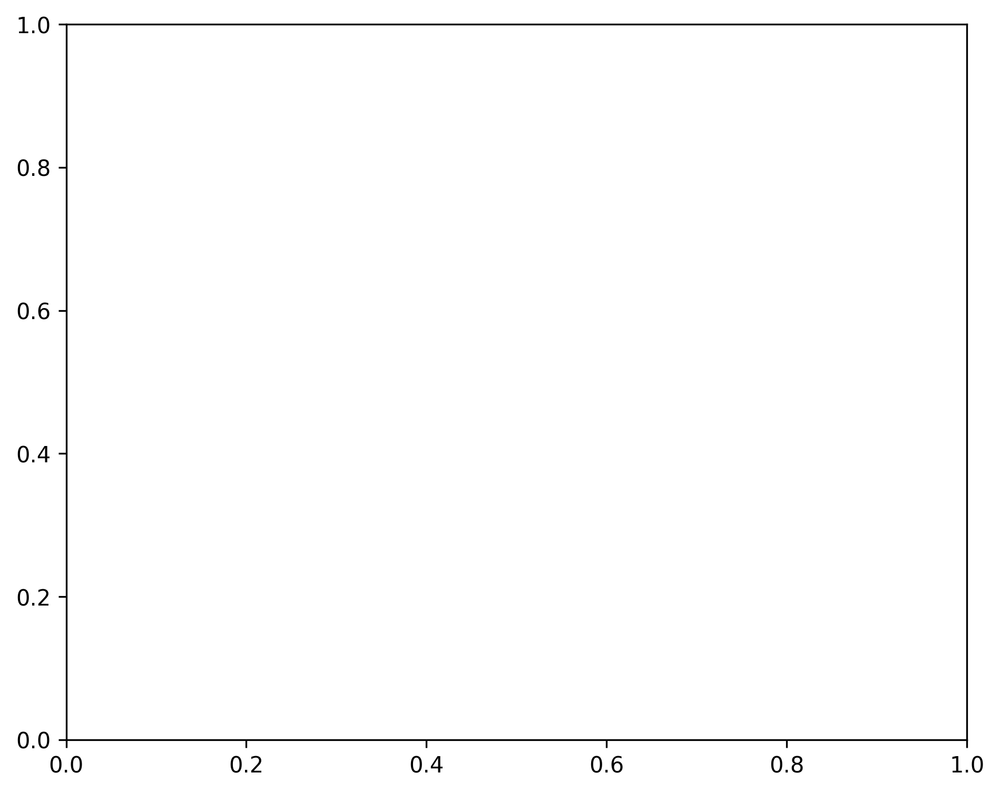

In [88]:
num_set2 = ['a','b','c','d','e','f','g','h','i']
st = pd.to_datetime('00:00:00').time()
end = pd.to_datetime('23:45:00').time()
fig = plt.figure(figsize=(25, 20), dpi=300)

for i in range(9):
    user = filter_set2[i]
    
    # Mask for Monday (September 10, 2018)
    mask1 = (
        (filtered_ec_df2['User'] == user) &  # Filter by user
        (filtered_ec_df2.index >= '2018-09-10 00:00:00') &  # Use >= and <=
        (filtered_ec_df2.index <= '2018-09-10 23:45:00')
    )
    d1 = filtered_ec_df2[mask1]['Energy_cons [kWh]']
    
    # Mask for Sunday (September 9, 2018)
    mask2 = (
        (filtered_ec_df2['User'] == user) &  # Filter by user
        (filtered_ec_df2.index >= '2018-09-09 00:00:00') &  # Use >= and <=
        (filtered_ec_df2.index <= '2018-09-09 23:45:00')
    )
    d2 = filtered_ec_df2[mask2]['Energy_cons [kWh]']
    
    plt.subplot(3, 3, i+1)
    if not d1.empty:
        x_seconds = [t.hour * 3600 + t.minute * 60 + t.second for t in d1.index.time]
        plt.plot(d1.index.time, d1.values, 'b', label='Monday')
    if not d2.empty:
        plt.plot(d2.index.time, d2.values, 'r', label='Sunday')
    plt.title(f"{num_set2[i]}) {user}")
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=6))
    plt.grid(which='major', axis='x')
    plt.legend()

fig.text(0.5, -0.02, 'Hours (15 minutes interval)', ha='center', fontsize=25)
fig.text(-0.01, 0.5, 'Electricity consumption (kWh)', va='center', rotation='vertical', fontsize=25)
fig.tight_layout(pad=0.4, w_pad=1.0, h_pad=2.0)
fig.savefig('plot_figure/daily_9plot.svg', dpi=300, bbox_inches='tight')
plt.close(fig)



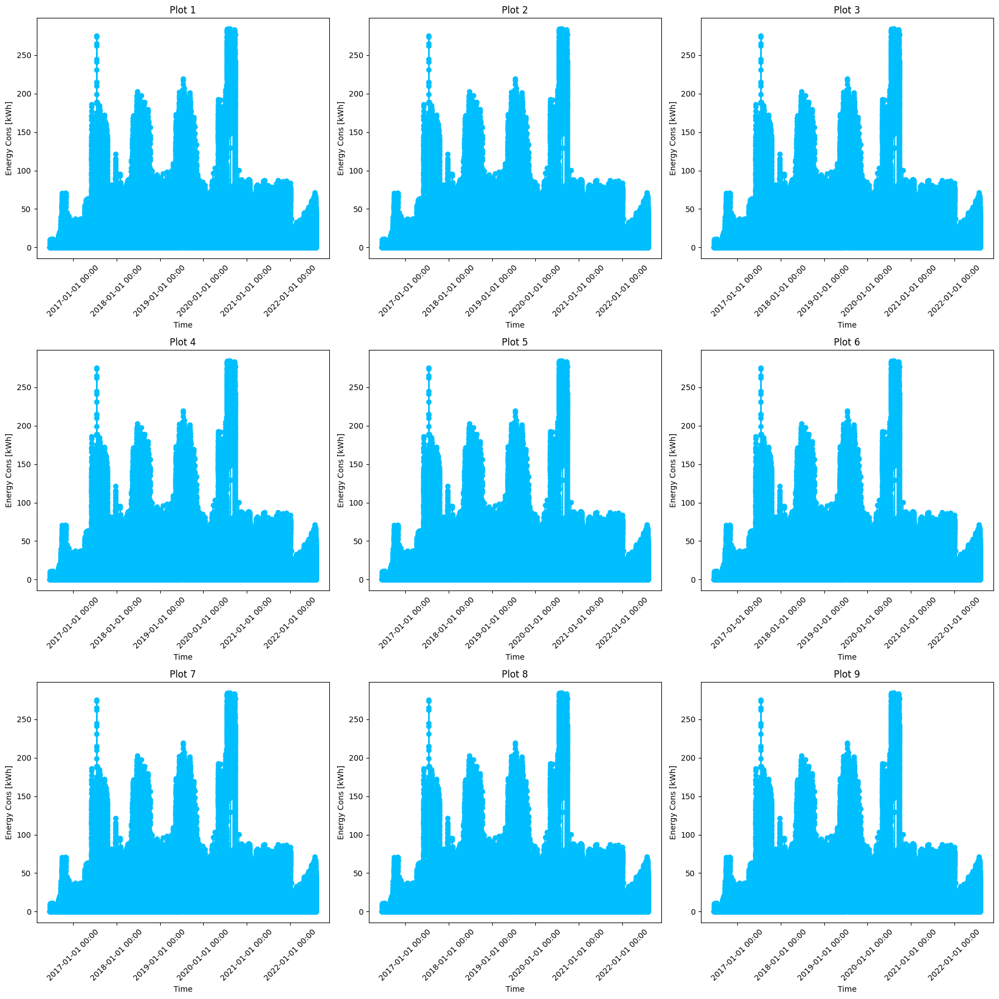

In [92]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()

# Example: Plot the same data in each subplot, but you can change parameters per plot
for i, ax in enumerate(axes):
    ax.plot(filtered_ec_df2.index, filtered_ec_df2['Energy_cons [kWh]'], 'o-', color='deepskyblue')
    ax.set_title(f'Plot {i+1}')
    ax.set_ylabel('Energy Cons [kWh]')
    ax.set_xlabel('Time')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


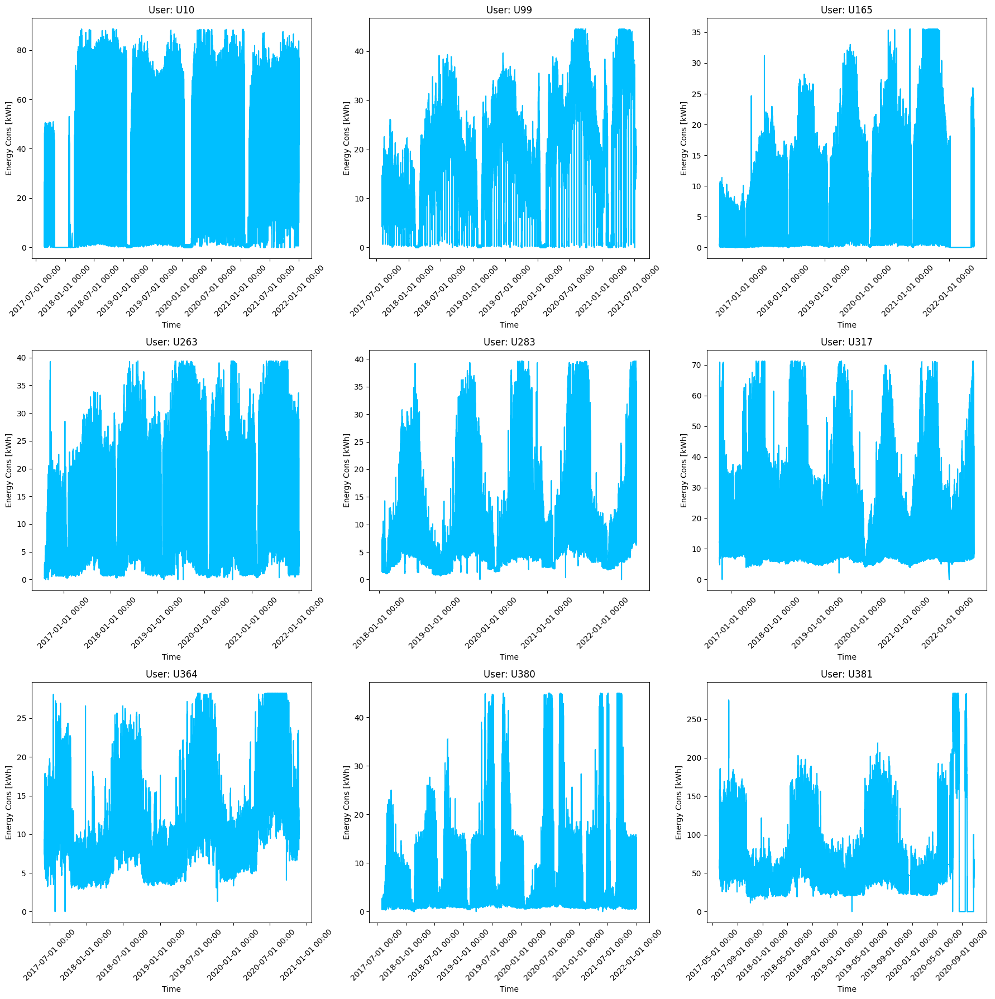

In [94]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 1. Get the unique users from your DataFrame
users = filtered_ec_df2['User'].unique()

# 2. Set up a 3x3 grid of subplots (total 9 subplots)
fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()  # Flatten to make it easier to loop

# 3. Loop through each user and each subplot
for i, ax in enumerate(axes):
    if i < len(users):
        user = users[i]
        # 4. Filter the DataFrame for the current user
        user_df = filtered_ec_df2[filtered_ec_df2['User'] == user]
        # 5. Plot the energy consumption for this user
        ax.plot(user_df.index, user_df['Energy_cons [kWh]'], marker=',', color='deepskyblue')
        # 6. Set the title to the user's name
        ax.set_title(f'User: {user}')
        # 7. Set axis labels
        ax.set_ylabel('Energy Cons [kWh]')
        ax.set_xlabel('Time')
        # 8. Format the x-axis to show dates and rotate labels for readability
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
        ax.tick_params(axis='x', rotation=45)
    else:
        # 9. Hide unused subplots if there are fewer than 9 users
        ax.set_visible(False)

# 10. Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()


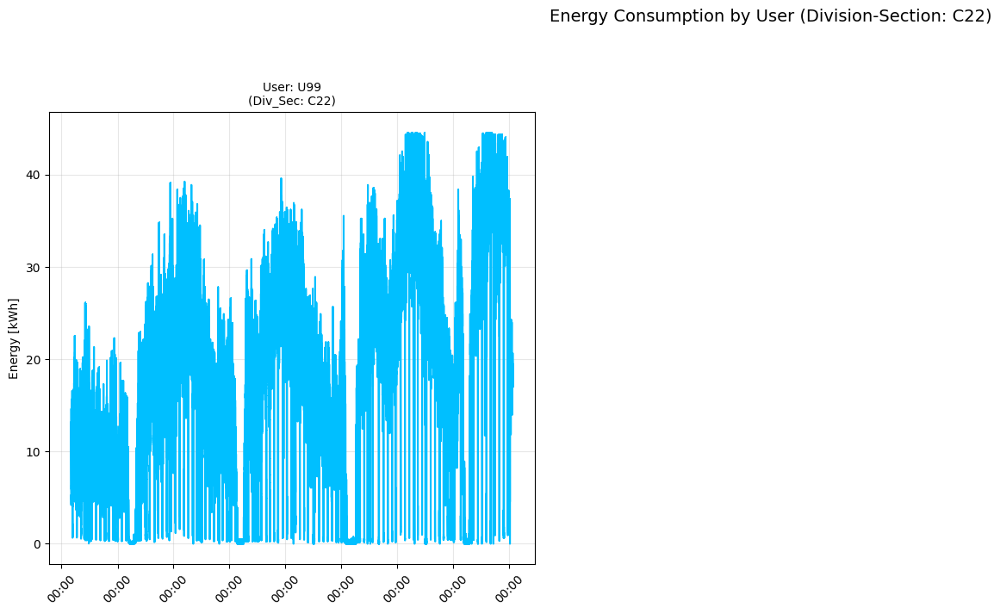

In [98]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# 1. First filter by Div_Sec (example: A02)
div_sec_filter = 'C22'  # Change this to your desired Div_Sec value
filtered_df = filtered_ec_df2.query("Div_Sec == @div_sec_filter")  # [4][5]

# 2. Get unique users from the filtered data
unique_users = filtered_df['User'].unique()[:9]  # Take first 9 users [2]

# 3. Create 3x3 plot grid
fig, axes = plt.subplots(3, 3, figsize=(18, 18))
axes = axes.flatten()  # Convert 3x3 grid to flat array for easier looping

# 4. Plot each user's data in separate subplot
for i, (ax, user) in enumerate(zip(axes, unique_users)):
    # Filter data for current user
    user_data = filtered_df[filtered_df['User'] == user]  # [1][4]
    
    # Plot energy consumption with circle markers and blue line
    ax.plot(user_data.index, 
            user_data['Energy_cons [kWh]'], 
            marker=',', 
            linestyle='-', 
            color='deepskyblue')
    
    # Customize subplot
    ax.set_title(f'User: {user}\n(Div_Sec: {div_sec_filter})', fontsize=10)  # [2]
    ax.set_ylabel('Energy [kWh]')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))  # Show time only [1]
    ax.tick_params(axis='x', rotation=45)
    ax.grid(alpha=0.3)  # Add subtle grid lines

# 5. Hide empty subplots if there are less than 9 users
for j in range(len(unique_users), 9):
    axes[j].set_visible(False)

# 6. Add overall title and adjust layout
plt.suptitle(f'Energy Consumption by User (Division-Section: {div_sec_filter})', 
             y=1.02, 
             fontsize=14)
plt.tight_layout()
plt.show()